# TABULAR PLAYGROUND SERIES NOV 2021

## MY NOTEBOOK

In [72]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import gc

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
from sklearn.metrics import plot_roc_curve
from sklearn.metrics import confusion_matrix
from sklearn.metrics import log_loss

import optuna
from optuna.integration import LightGBMPruningCallback

In [4]:
FOLDER_PATH = 'tps-nov-2021'
TRAIN_FILE = 'train.csv'
TEST_FILE = 'test.csv'

TRAIN_PATH = os.path.join(FOLDER_PATH, TRAIN_FILE)
TEST_PATH = os.path.join(FOLDER_PATH, TEST_FILE)

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', None)

In [5]:
train_df = pd.read_csv(TRAIN_PATH)
test_df = pd.read_csv(TEST_PATH)

In [6]:
train_df.head()

,id,f0,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28,f29,f30,f31,f32,f33,f34,f35,f36,f37,f38,f39,f40,f41,f42,f43,f44,f45,f46,f47,f48,f49,f50,f51,f52,f53,f54,f55,f56,f57,f58,f59,f60,f61,f62,f63,f64,f65,f66,f67,f68,f69,f70,f71,f72,f73,f74,f75,f76,f77,f78,f79,f80,f81,f82,f83,f84,f85,f86,f87,f88,f89,f90,f91,f92,f93,f94,f95,f96,f97,f98,f99,target
0,0,0.106643,3.59437,132.8040,3.18428,0.081971,1.18859,3.73238,2.266270,2.09959,0.012330,1.607190,-0.318058,0.560137,2.806880,1.35114,2.535930,0.197527,0.676494,1.98979,-3.842450,0.037380,0.230322,3.33055,0.009397,0.144738,3.05131,1.30362,0.033225,-0.018284,2.748210,-0.009294,-0.036271,-0.049871,0.019484,3.898460,11.2863,1.138020,3.366880,4.94446,-0.105772,2.11345,3.452230,0.789430,1.113210,1.49157,2.440370,0.041824,3.35537,0.053691,1.701270,0.908831,0.094902,0.030219,0.597024,4.443410,1.586490,-0.068686,-0.108268,0.061044,0.046099,0.017113,-0.027551,0.019483,-0.048826,0.050748,3.729300,5.017440,4.186880,0.063342,0.121043,1.37175,4.017450,0.167613,0.039753,2.042360,-0.016614,0.107679,3.507250,0.013660,-0.097023,5.396070,0.244457,3.49184,0.113090,-0.015472,4.208790,4.106560,0.037227,-0.118814,0.067086,0.010739,1.09862,0.013331,-0.011715,0.052759,0.065400,4.211250,1.97877,0.085974,0.240496,0
1,1,0.125021,1.67336,76.5336,3.37825,0.099400,5.09366,1.27562,-0.471318,4.54594,0.037706,0.331749,0.325091,0.062040,2.262150,4.33943,-0.224999,0.233586,3.381280,1.90299,0.067874,-0.051268,0.006135,2.60444,0.103441,0.067638,4.75362,1.85552,-0.181834,0.008359,3.166340,0.011850,0.022292,0.069320,0.117109,0.315276,24.4807,1.672270,-0.409067,4.95475,0.092358,2.60318,1.954690,0.005896,3.289340,2.56453,0.817706,0.025997,4.61749,1.575540,0.066105,0.681634,0.025247,0.183500,0.110038,2.746120,0.835586,0.188196,4.960640,0.136087,-0.008493,-0.015264,-0.010841,0.064584,0.102548,0.093611,0.964089,0.630422,4.307340,0.091289,-0.036360,3.61767,3.103240,0.000657,0.051302,1.924620,0.123294,-0.022671,1.548120,-0.010397,0.058330,3.661310,-0.118386,2.35739,-0.009112,0.178701,4.097350,3.532890,0.005244,0.121381,0.109968,0.135838,3.46017,0.017054,0.124863,0.154064,0.606848,-0.267928,2.57786,-0.020877,0.024719,0
2,2,0.036330,1.49747,233.5460,2.19435,0.026914,3.12694,5.05687,3.849460,1.80187,0.056995,0.328684,2.968810,0.105244,2.069490,5.30986,1.354790,-0.262018,1.379080,1.48091,0.020542,-0.008806,0.109348,1.68365,0.038180,0.123716,1.11248,3.57166,0.120601,0.082069,2.233520,0.002270,0.045182,0.014405,0.011599,-0.502849,33.7382,1.417500,1.071350,3.22296,2.122030,3.08216,0.637555,-0.006822,-0.390943,17.34570,3.700430,-0.033600,1.57824,0.051978,-0.002004,2.690960,0.018367,-0.030468,0.111409,2.187470,-0.325000,-0.019944,3.455030,0.068105,-0.009812,-0.010627,0.027571,-0.007121,-0.048914,-0.002574,1.865090,2.404170,0.411741,0.057749,0.525174,2.16879,0.828297,0.089848,0.093744,4.949010,-0.010978,0.076671,0.266784,0.038691,0.382731,3.847600,-0.121482,3.74084,0.147098,-0.016566,0.614651,2.125840,0.078828,0.979808,0.026758,0.117310,4.88300,0.085222,0.032396,0.116092,-0.001688,-0.520069,2.14112,0.124464,0.148209,0
3,3,-0.014077,0.24600,779.9670,1.89064,0.006948,1.53112,2.69800,4.517330,4.50332,0.123494,1.002680,4.869600,0.058411,2.497850,1.23843,2.348360,0.175475,1.608890,2.02881,0.042086,0.005141,0.076506,1.65122,0.111813,0.121641,0.58912,4.23692,-0.032843,0.058168,0.712927,0.097465,0.072744,0.000324,0.063362,4.063820,25.3824,0.576572,2.026210,2.96843,1.085670,1.71088,1.371820,0.034631,0.722607,71.44850,3.034580,0.092245,3.45310,0.044829,0.027195,4.082850,0.046955,0.063695,0.029225,0.672022,0.185311,0.164284,3.804560,0.062306,-0.021406,0.009471,0.110884,0.026837,2.931160,0.068112,-0.495192,1.345280,2.242750,0.035611,-0.139274,4.74243,3.292740,0.117877,0.065605,0.556711,-0.058029,0.070501,1.101250,0.068559,0.162928,4.070180,-0.008835,3.89678,0.913739,-0.163204,3.074850,4.356780,-0.048894,4.917990,0.069930,-0.015347,3.47439,-0.017103,-0.008100,0.062013,0.041193,0.511657,1.96860,0.04001

In [7]:
train_df.shape

(600000, 102)

In [8]:
test_df.head()

,id,f0,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28,f29,f30,f31,f32,f33,f34,f35,f36,f37,f38,f39,f40,f41,f42,f43,f44,f45,f46,f47,f48,f49,f50,f51,f52,f53,f54,f55,f56,f57,f58,f59,f60,f61,f62,f63,f64,f65,f66,f67,f68,f69,f70,f71,f72,f73,f74,f75,f76,f77,f78,f79,f80,f81,f82,f83,f84,f85,f86,f87,f88,f89,f90,f91,f92,f93,f94,f95,f96,f97,f98,f99
0,600000,0.003229,4.838660,585.529,2.282910,0.713180,3.907830,0.480696,1.482270,4.891810,0.056351,4.200990,3.151800,0.000349,1.85116,2.63889,0.746668,-0.004756,1.610300,4.11482,-0.077756,0.129446,0.053324,0.416789,0.445009,0.150464,5.021300,2.22139,-0.072333,-0.215874,1.56236,0.074881,0.010050,0.018582,0.067466,5.57830,3.08556,3.842470,0.011125,2.35997,0.695092,-0.345747,4.38817,0.054919,2.80360,3.87234,3.974520,0.157887,0.704785,-0.001126,-0.004548,1.01082,0.094506,0.016935,0.100871,4.36695,1.832040,0.019682,1.964200,0.120581,0.080247,0.027516,0.048825,0.074626,0.041264,0.069319,4.248810,2.09195,0.695042,0.007464,-0.017882,1.883500,1.268030,0.023747,0.043071,3.174780,0.074356,0.125909,3.926430,0.046914,-0.042290,3.01925,0.089564,3.20070,0.009679,-0.099653,3.573060,4.79727,0.091985,0.773543,0.073380,0.112910,1.073550,0.122149,0.086330,0.036010,0.010619,0.290343,1.898200,0.131533,0.012047
1,600001,0.008602,0.505536,-100.099,3.012670,0.027199,1.194610,5.036620,2.517440,4.553890,0.063876,0.337257,4.439690,0.013188,3.37901,3.38470,1.167400,2.246550,1.750170,2.76624,-0.058501,0.012595,0.036144,0.769057,0.017496,0.050283,0.324697,4.94864,0.124789,0.347128,1.24512,0.035822,-0.013188,0.023194,0.006444,4.98333,23.70690,8.287290,4.796230,1.79928,-0.050040,1.973320,1.91201,0.035974,2.57237,6.32126,0.442628,0.148115,1.311350,0.106667,0.626128,2.30973,-0.044350,0.194283,0.131445,4.26667,0.715653,0.017117,2.839080,0.104712,-0.007952,0.067650,0.066438,0.034258,0.606144,0.019988,-0.456704,3.37877,1.900050,0.052316,-0.050397,2.612950,3.112540,0.022305,0.108325,4.617640,0.091440,0.039368,3.035190,1.023050,-0.020578,2.77156,3.309480,5.05840,-0.003993,0.067636,0.995391,2.47165,-0.015214,0.263423,-0.021910,-0.020214,2.622340,0.123307,0.033063,0.123059,0.005771,-0.392923,3.689640,0.047418,0.120015
2,600002,1.461000,2.437260,-112.964,3.541230,0.752338,4.338310,1.648080,4.699910,1.950250,0.005303,2.071680,0.546499,0.141781,1.67317,4.30649,1.702330,-0.062869,1.619230,4.19053,0.055140,-0.016590,0.017805,3.064810,0.070370,0.098316,3.507540,1.06910,0.012750,0.009981,3.46781,0.035920,-0.009804,0.065728,-0.004725,5.28102,11.52880,0.171694,4.394570,2.52084,0.079365,5.451320,1.78582,0.029620,3.06383,5.27599,0.315972,0.148310,0.463193,-0.039962,0.150592,3.75460,0.024164,0.107455,0.048741,3.58240,0.966391,-0.058947,1.869830,0.029872,-0.044294,0.065172,-0.003328,-0.001950,0.095007,0.080267,3.337300,3.60489,4.694580,0.075650,-0.088276,1.772440,-0.142226,0.000918,0.021483,0.241844,0.067591,-0.026572,0.894909,0.111606,0.524423,1.45007,0.019355,1.27135,0.076042,0.446993,4.406990,2.44697,-0.041154,0.212414,0.141005,-0.011036,2.030180,-0.000426,0.084091,0.123605,0.499554,4.054650,3.330670,0.108843,0.064687
3,600003,0.140556,3.085610,179.451,0.573945,0.057342,2.216790,1.623480,0.526174,1.542540,-0.026160,1.609440,1.723560,-0.019564,1.55213,4.83264,1.501640,0.192669,4.614890,1.47069,-0.010031,0.072805,0.048035,3.230210,-0.031548,0.028697,3.752520,4.94847,-0.174542,-0.033491,2.47823,0.068129,0.090797,0.029877,0.146718,3.16983,-12.98460,3.135210,1.765010,3.25399,0.713238,3.729920,2.65153,0.080945,1.05649,1.45260,1.814190,0.077875,2.721310,0.004530,0.108844,2.83445,0.024642,-0.051423,0.060574,3.42020,1.283600,-0.083213,0.048820,-0.002502,0.051387,0.075775,-0.008900,0.141776,0.173123,0.012894,3.390590,2.69899,0.059916,0.055400,-0.000140,2.641440,0.839721,-0.026268,0.058745,2.521910,0.118737,0.134899,2.839480,0.108751,-0.015848,1.14724,0.390064,3.30923,-0.046117,-0.206052,2.373770,3.15941,0.131234,1.031180,0.026155,0.050117,0.221613,0.045298,0.129966,0.004015,0.018279,2.696580,-0.533491,

In [9]:
test_df.shape

(540000, 101)

In [15]:
# distribution of target

train_target = train_df.groupby(by='target').count()[['id']]
train_target

,id
target,
0,296394
1,303606


In [19]:
train_df.drop(columns=['id']).describe().T.style.background_gradient(subset=['mean'], cmap='flare')

,count,mean,std,min,25%,50%,75%,max
f0,600000.000000,0.306508,0.522450,-3.797450,0.026222,0.097788,0.397184,8.781500
f1,600000.000000,2.497590,1.554018,-1.223960,1.186237,2.516500,3.787630,6.226720
f2,600000.000000,306.644536,551.743893,-1842.530000,43.573400,133.626000,302.262250,6119.280000
f3,600000.000000,2.647901,1.544529,-1.368560,1.442028,2.634130,3.907640,6.521150
f4,600000.000000,0.177850,0.417488,-3.206210,0.019709,0.061586,0.112712,8.265470
f5,600000.000000,2.556832,1.562527,-1.169770,1.261038,2.590425,3.813662,6.515070
f6,600000.000000,2.699650,1.564000,-1.059310,1.385820,2.801255,3.996913,6.586780
f7,600000.000000,2.571593,1.549361,-1.281970,1.333848,2.557985,3.823450,6.258770
f8,600000.000000,2.538273,1.532988,-1.242020,1.292163,2.475880,3.804360,6.389670
f9,600000.000000,0.134370,0.421892,-2.577840,0.019563,0.058752,0.101046,7.078460


In [20]:
test_df.drop(columns=['id']).describe().T.style.background_gradient(subset=['mean'], cmap='flare')

,count,mean,std,min,25%,50%,75%,max
f0,540000.000000,0.348663,0.566251,-3.628650,0.043555,0.115868,0.457939,8.666950
f1,540000.000000,2.618251,1.543507,-1.260150,1.326280,2.657140,3.884850,6.434070
f2,540000.000000,263.577730,496.444309,-1764.160000,27.361175,115.631000,245.446250,6098.190000
f3,540000.000000,2.583735,1.529646,-1.370560,1.408300,2.547380,3.812990,6.275570
f4,540000.000000,0.211793,0.468154,-3.868460,0.028489,0.072008,0.125637,7.915200
f5,540000.000000,2.709543,1.568074,-1.180650,1.400490,2.797510,3.982830,6.444200
f6,540000.000000,2.762370,1.586975,-1.126370,1.433133,2.892945,4.083213,6.726750
f7,540000.000000,2.479384,1.520741,-1.284250,1.278905,2.456350,3.694180,6.339400
f8,540000.000000,2.549483,1.520833,-1.084660,1.306570,2.485895,3.811365,6.180310
f9,540000.000000,0.125970,0.399739,-2.692380,0.019464,0.057811,0.098911,7.819170


### FEATURE DISTRIBUTION

In [48]:
# select all the features 

cols = [col for col in train_df.columns if col.startswith('f')]

train_sample = train_df.sample(60_000)

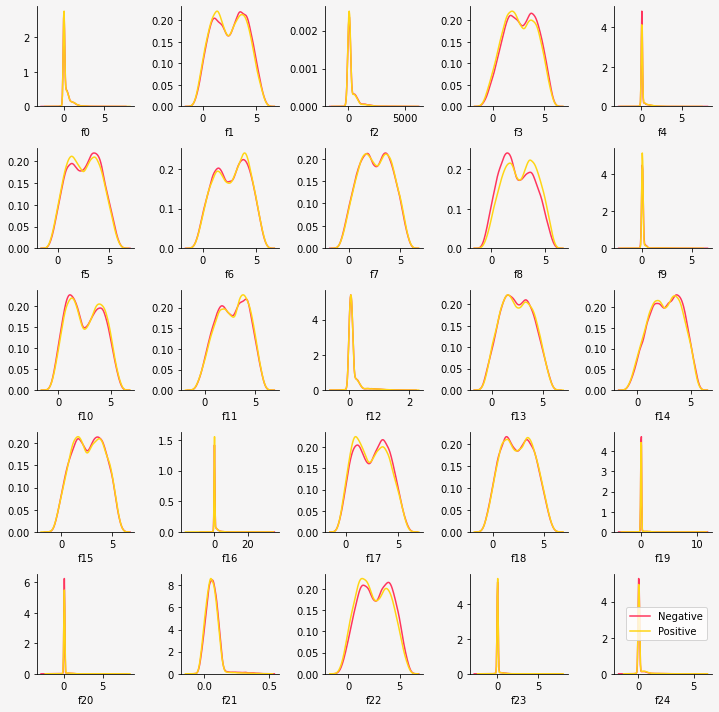

In [50]:
GREY = '#F6F5F5'
GOLD = '#FF355D'
BERRY = '#FFD514'

fig, axes = plt.subplots(5, 5, figsize=(10, 10))
axes = axes.flatten()
fig.set_facecolor(GREY)

for i, col in enumerate(cols[:25]):
    sns.kdeplot(data=train_sample[train_sample['target']==0], x=col, 
                color=GOLD, label='Negative', zorder=1, ax=axes[i])
    sns.kdeplot(data=train_sample[train_sample['target']==1], x=col, 
                color=BERRY, label='Positive', zorder=1, ax=axes[i])
    axes[i].set_facecolor(GREY)
    axes[i].set_ylabel('')
    
    for s in ['top', 'right']:
        axes[i].spines[s].set_visible(False)
    
plt.tight_layout()
plt.legend(loc='best')
plt.show()

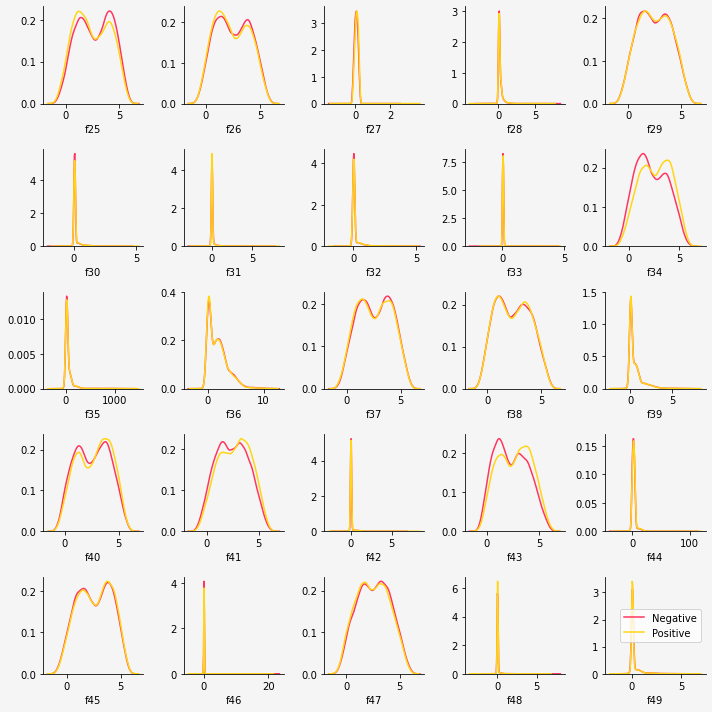

In [51]:
fig, axes = plt.subplots(5, 5, figsize=(10, 10))
axes = axes.flatten()
fig.set_facecolor(GREY)

for i, col in enumerate(cols[25:50]):
    sns.kdeplot(data=train_sample[train_sample['target']==0], x=col, 
                color=GOLD, label='Negative', zorder=1, ax=axes[i])
    sns.kdeplot(data=train_sample[train_sample['target']==1], x=col, 
                color=BERRY, label='Positive', zorder=1, ax=axes[i])
    axes[i].set_facecolor(GREY)
    axes[i].set_ylabel('')
    
    for s in ['top', 'right']:
        axes[i].spines[s].set_visible(False)
    
plt.tight_layout()
plt.legend(loc='best')
plt.show()

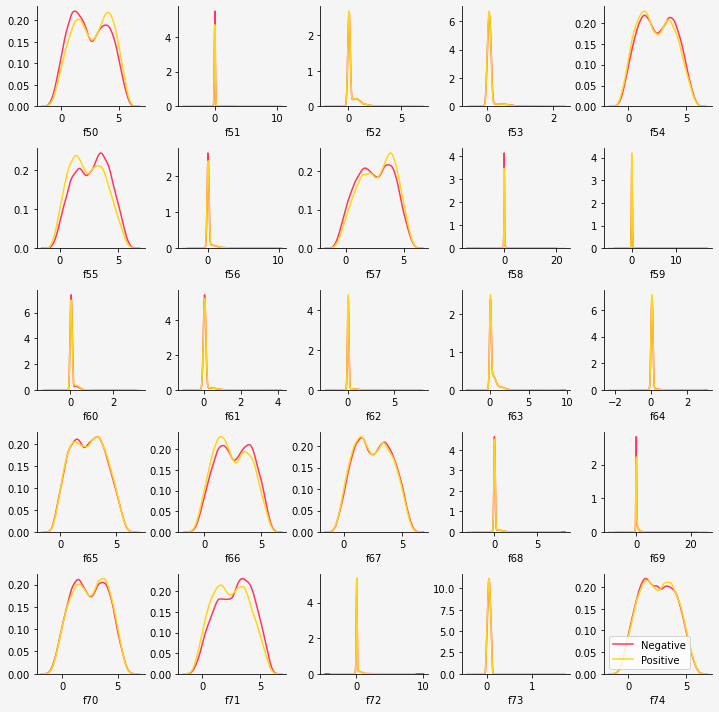

In [52]:
fig, axes = plt.subplots(5, 5, figsize=(10, 10))
axes = axes.flatten()
fig.set_facecolor(GREY)

for i, col in enumerate(cols[50:75]):
    sns.kdeplot(data=train_sample[train_sample['target']==0], x=col, 
                color=GOLD, label='Negative', zorder=1, ax=axes[i])
    sns.kdeplot(data=train_sample[train_sample['target']==1], x=col, 
                color=BERRY, label='Positive', zorder=1, ax=axes[i])
    axes[i].set_facecolor(GREY)
    axes[i].set_ylabel('')
    
    for s in ['top', 'right']:
        axes[i].spines[s].set_visible(False)
    
plt.tight_layout()
plt.legend(loc='best')
plt.show()

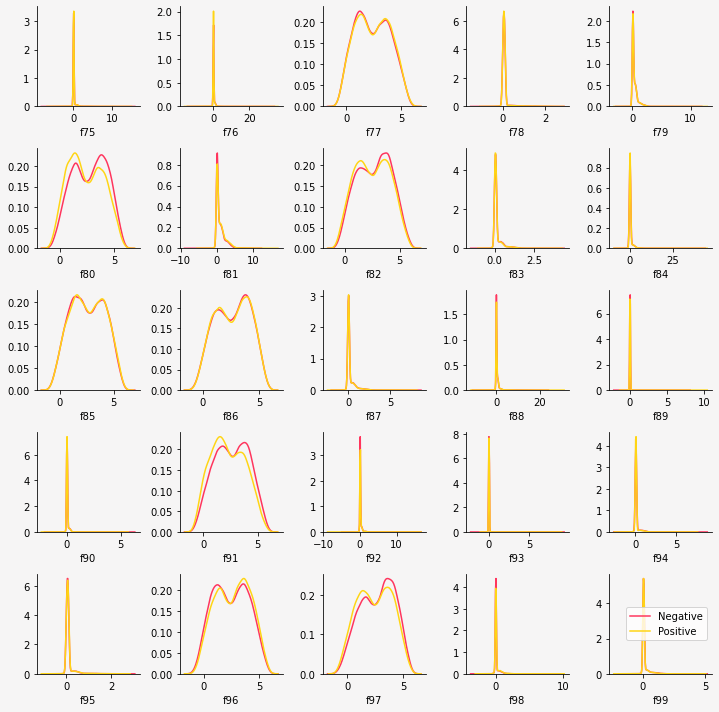

In [53]:
fig, axes = plt.subplots(5, 5, figsize=(10, 10))
axes = axes.flatten()
fig.set_facecolor(GREY)

for i, col in enumerate(cols[75:100]):
    sns.kdeplot(data=train_sample[train_sample['target']==0], x=col, 
                color=GOLD, label='Negative', zorder=1, ax=axes[i])
    sns.kdeplot(data=train_sample[train_sample['target']==1], x=col, 
                color=BERRY, label='Positive', zorder=1, ax=axes[i])
    axes[i].set_facecolor(GREY)
    axes[i].set_ylabel('')
    
    for s in ['top', 'right']:
        axes[i].spines[s].set_visible(False)
    
plt.tight_layout()
plt.legend(loc='best')
plt.show()

### MODELING

#### BASIC MODELING

In [54]:
lgbm = LGBMClassifier()
cat = CatBoostClassifier()
xgb = XGBClassifier()

In [63]:
X = train_df.drop(columns=['id', 'target']).values
y = train_df['target'].values

skf = StratifiedKFold(n_splits=5, random_state=42, shuffle=True)

y_pred = np.zeros(train_df.shape[0])
y_pred_binary = np.zeros(train_df.shape[0])

for train_idx, valid_idx in skf.split(X, y):
    X_train, y_train = X[train_idx], y[train_idx]
    X_valid, y_valid = X[valid_idx], y[valid_idx]
    
    lgbm.fit(X_train, y_train)
    y_pred[valid_idx] = lgbm.predict_proba(X_valid)[:, 1]
    y_pred_binary[valid_idx] = lgbm.predict(X_valid)

print(roc_auc_score(y, y_pred))
    

0.731613829881009


In [64]:
confusion_matrix(y, y_pred_binary)

array([[201334,  95060],
       [ 88434, 215172]], dtype=int64)

#### MODEL OPTIMIZATION

``` 
TREE STRUCTURE
1. num_leaves [2^3, 2^12] [8, 4096] [20, 3000]
2. max_depth [3, 12]
3. min_data_in_leaf [depends on num_leaves, set a value in hundreds or thousands for large datasets]

ACCURACY
1. n_estimators
2. learning_rate
[use many trees with early stopping and set a low value for learning_rate]

OVERFITTING
1. lambda_l1 [1, 100]
2. lambda_l2 [1, 100]
3. min_gain_to_split [0, 15]
4. bagging_fraction [0, 1]
5. feature_fraction [0, 1]
```

In [81]:
def objective(trial, X, y):
    param_grid = {
        # ACCURACY
        'n_estimators': trial.suggest_categorical(
            'n_estimators', [10_000]), 
        'learning_rate': trial.suggest_float(
            'learning_rate', 0.01, 0.3), 
        # STRUCTURE
        'num_leaves': trial.suggest_int(
            'num_leaves', 20, 3_000, step=20), 
        'max_depth': trial.suggest_int(
            'max_depth', 3, 12), 
        'min_data_in_leaf': trial.suggest_int(
            'min_data_in_leaf', 200, 10_000, step=100), 
        # OVERFITTING
        'max_bin': trial.suggest_int(
            'max_bin', 200, 300), 
        'lambda_l1': trial.suggest_int(
            'lambda_l1', 0, 100, step=5), 
        'lambda_l2': trial.suggest_int(
            'lambda_l2', 0, 100, step=5), 
        'min_gain_to_split': trial.suggest_float(
            'min_gain_to_split', 0, 15), 
        'bagging_fraction': trial.suggest_float(
            'bagging_fraction', 0.1, 0.9, step=0.1), 
        'bagging_freq': trial.suggest_categorical(
            'bagging_freq', [1]), 
        'feature_fraction': trial.suggest_float(
            'feature_fraction', 0.1, 0.9, step=0.1), 
    }
    
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    
    cv_scores = np.empty(5)
    for idx, (train_idx, test_idx) in enumerate(cv.split(X, y)):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]
        
        model = LGBMClassifier(objective='binary', **param_grid)
        model.fit(X_train, y_train, eval_set=[(X_test, y_test)], 
                  eval_metric='auc', early_stopping_rounds=100, # eval_metric was 'binary_logloss'
                 callbacks=[LightGBMPruningCallback(trial, 'binary_logloss')], 
                 verbose=False)
        
        preds = model.predict_proba(X_test)[:, 1]
        cv_scores[idx] = log_loss(y_test, preds)
        
    return np.mean(cv_scores)

In [75]:
%%time 

study = optuna.create_study(direction='minimize', study_name='LGBM Classifier')
func = lambda trial: objective(trial, X, y)
study.optimize(func, n_trials=20)

[I 2023-02-21 16:22:44,616] A new study created in memory with name: LGBM Classifier


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=12.248151395821322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.248151395821322
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.1, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
Training until validation scores don't improve for 100 rounds
[500]	valid_0's binary_logloss: 0.612344
[1000]	valid_0's binary_logloss: 0.611794
Early stopping, best iter

C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: 

[500]	valid_0's binary_logloss: 0.611457


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 532 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 533 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 534 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 535 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 536 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:

[1000]	valid_0's binary_logloss: 0.611049


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1019 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1020 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1021 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1022 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_tria

Early stopping, best iteration is:
[1094]	valid_0's binary_logloss: 0.610988
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=12.248151395821322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.248151395821322
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.1, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: 

[500]	valid_0's binary_logloss: 0.611353


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:

[1000]	valid_0's binary_logloss: 0.610909


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1047 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1048 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1049 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1050 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1051 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_tria

Early stopping, best iteration is:
[1322]	valid_0's binary_logloss: 0.610691
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=12.248151395821322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.248151395821322
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.1, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: 

[500]	valid_0's binary_logloss: 0.610776


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 546 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 547 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 548 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 549 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:

[1000]	valid_0's binary_logloss: 0.610321
Early stopping, best iteration is:
[905]	valid_0's binary_logloss: 0.610311
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=12.248151395821322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.248151395821322
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.1, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: 

[500]	valid_0's binary_logloss: 0.609217


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 508 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:

[1000]	valid_0's binary_logloss: 0.608633


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1042 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1043 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1044 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1045 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1046 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_tria

Early stopping, best iteration is:
[966]	valid_0's binary_logloss: 0.608616


[I 2023-02-21 16:23:16,364] Trial 0 finished with value: 0.6105003692493318 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12945477828959354, 'num_leaves': 960, 'max_depth': 5, 'min_data_in_leaf': 1500, 'max_bin': 246, 'lambda_l1': 5, 'lambda_l2': 25, 'min_gain_to_split': 12.248151395821322, 'bagging_fraction': 0.1, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 0 with value: 0.6105003692493318.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=2.9889410558950305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9889410558950305
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
Training until validation scores don't improve for 100 rounds
[500]	valid_0's binary_logloss: 0.611274
[1000]	valid_0's binary_logloss: 

C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: 

[500]	valid_0's binary_logloss: 0.609907


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:

[1000]	valid_0's binary_logloss: 0.608449


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1019 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1020 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1021 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1022 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_tria

[1500]	valid_0's binary_logloss: 0.608339


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1520 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1521 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1522 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1523 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1524 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_tria

Early stopping, best iteration is:
[1558]	valid_0's binary_logloss: 0.608329
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=2.9889410558950305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9889410558950305
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: 

[500]	valid_0's binary_logloss: 0.610099


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:

[1000]	valid_0's binary_logloss: 0.608502


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1014 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1015 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1016 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1017 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1018 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_tria

[1500]	valid_0's binary_logloss: 0.608352


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1507 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1508 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1509 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1510 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1511 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_tria

[2000]	valid_0's binary_logloss: 0.608282
[2500]	valid_0's binary_logloss: 0.608228
Early stopping, best iteration is:
[2563]	valid_0's binary_logloss: 0.608217
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=2.9889410558950305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9889410558950305
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Curre

C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: 

[500]	valid_0's binary_logloss: 0.610086


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:

[1000]	valid_0's binary_logloss: 0.608569


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1020 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1021 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1022 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1024 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_tria

[1500]	valid_0's binary_logloss: 0.608433


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1505 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1506 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1507 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1508 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1509 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_tria

Early stopping, best iteration is:
[1828]	valid_0's binary_logloss: 0.608378
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=2.9889410558950305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9889410558950305
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: 

[500]	valid_0's binary_logloss: 0.608411


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:

[1000]	valid_0's binary_logloss: 0.606586


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1022 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1024 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1025 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1026 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_tria

[1500]	valid_0's binary_logloss: 0.60642


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1502 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1503 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1504 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1505 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1506 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_tria

Early stopping, best iteration is:
[1496]	valid_0's binary_logloss: 0.606417


[I 2023-02-21 16:24:48,541] Trial 1 finished with value: 0.6081968214052521 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07577802163057788, 'num_leaves': 1360, 'max_depth': 5, 'min_data_in_leaf': 8700, 'max_bin': 245, 'lambda_l1': 55, 'lambda_l2': 65, 'min_gain_to_split': 2.9889410558950305, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1 with value: 0.6081968214052521.


[LightGBM] [Warning] feature_fraction is set=0.7000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=11.620663866858552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.620663866858552
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
Training until validation scores don't improve for 100 rounds
[500]	valid_0's binary_logloss: 0.612699
[1000]	valid_0's binary_logloss: 0.

C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: Us

[500]	valid_0's binary_logloss: 0.611529


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:

Early stopping, best iteration is:
[873]	valid_0's binary_logloss: 0.611486
[LightGBM] [Warning] feature_fraction is set=0.7000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=11.620663866858552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.620663866858552
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: Us

[500]	valid_0's binary_logloss: 0.611906


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:

Early stopping, best iteration is:
[611]	valid_0's binary_logloss: 0.611887
[LightGBM] [Warning] feature_fraction is set=0.7000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=11.620663866858552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.620663866858552
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: Us

[500]	valid_0's binary_logloss: 0.611228


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 508 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:

Early stopping, best iteration is:
[611]	valid_0's binary_logloss: 0.611175
[LightGBM] [Warning] feature_fraction is set=0.7000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=11.620663866858552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.620663866858552
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: Us

[500]	valid_0's binary_logloss: 0.609506


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:

[1000]	valid_0's binary_logloss: 0.609401


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1012 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1013 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1014 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1015 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1016 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_tria

Early stopping, best iteration is:
[954]	valid_0's binary_logloss: 0.609399


[I 2023-02-21 16:25:54,293] Trial 2 finished with value: 0.6113144053881878 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25065384676823144, 'num_leaves': 760, 'max_depth': 11, 'min_data_in_leaf': 8700, 'max_bin': 229, 'lambda_l1': 5, 'lambda_l2': 100, 'min_gain_to_split': 11.620663866858552, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7000000000000001}. Best is trial 1 with value: 0.6081968214052521.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=2.304974307176064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.304974307176064
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
Training until validation scores don't improve for 100 rounds
[500]	valid_0's binary_logloss: 0.609556
Early stopping, best iteration is:
[722]	valid_0's binary_logloss: 

C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: 

[500]	valid_0's binary_logloss: 0.608578


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:

[1000]	valid_0's binary_logloss: 0.608358
Early stopping, best iteration is:
[926]	valid_0's binary_logloss: 0.608342
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=2.304974307176064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.304974307176064
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: 

[500]	valid_0's binary_logloss: 0.608466


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:

[1000]	valid_0's binary_logloss: 0.608136


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1014 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1015 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1016 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1017 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1018 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_tria

Early stopping, best iteration is:
[946]	valid_0's binary_logloss: 0.608123
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=2.304974307176064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.304974307176064
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: 

[500]	valid_0's binary_logloss: 0.608812


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:

[1000]	valid_0's binary_logloss: 0.608573


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1005 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1006 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1007 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1008 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1009 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_tria

Early stopping, best iteration is:
[1035]	valid_0's binary_logloss: 0.608545
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=2.304974307176064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.304974307176064
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: 

[500]	valid_0's binary_logloss: 0.606507


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:

[1000]	valid_0's binary_logloss: 0.606183
Early stopping, best iteration is:
[902]	valid_0's binary_logloss: 0.606168


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1001 is already reported.
  warnings.warn(
[I 2023-02-21 16:26:47,256] Trial 3 finished with value: 0.6081281293215115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13596772684407193, 'num_leaves': 2360, 'max_depth': 6, 'min_data_in_leaf': 3500, 'max_bin': 206, 'lambda_l1': 65, 'lambda_l2': 30, 'min_gain_to_split': 2.304974307176064, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 3 with value: 0.6081281293215115.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.9394630936908042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9394630936908042
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
Training until validation scores don't improve for 100 rounds
[500]	valid_0's binary_logloss: 0.608921
Early stopping, best iteration is:
[442]	valid_0's binary_logloss: 

C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: Us

[500]	valid_0's binary_logloss: 0.60754
Early stopping, best iteration is:
[413]	valid_0's binary_logloss: 0.607496


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.9394630936908042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9394630936908042
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: Use

[500]	valid_0's binary_logloss: 0.607537


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 508 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:

Early stopping, best iteration is:
[422]	valid_0's binary_logloss: 0.607446
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.9394630936908042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9394630936908042
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: User

[500]	valid_0's binary_logloss: 0.60758


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:

Early stopping, best iteration is:
[458]	valid_0's binary_logloss: 0.607543
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.9394630936908042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9394630936908042
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: User

[500]	valid_0's binary_logloss: 0.605641
Early stopping, best iteration is:
[400]	valid_0's binary_logloss: 0.605623


[I 2023-02-21 16:27:54,649] Trial 4 finished with value: 0.6073883465102191 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1066250397171748, 'num_leaves': 1220, 'max_depth': 8, 'min_data_in_leaf': 2200, 'max_bin': 201, 'lambda_l1': 5, 'lambda_l2': 65, 'min_gain_to_split': 1.9394630936908042, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 4 with value: 0.6073883465102191.


[LightGBM] [Warning] feature_fraction is set=0.7000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=12.336677816565919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.336677816565919
[LightGBM] [Warning] lambda_l1 is set=90, reg_alpha=0.0 will be ignored. Current value: lambda_l1=90
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
Training until validation scores don't improve for 100 rounds


[I 2023-02-21 16:27:57,735] Trial 5 pruned. Trial was pruned at iteration 116.


Training until validation scores don't improve for 100 rounds


[I 2023-02-21 16:28:07,776] Trial 6 pruned. Trial was pruned at iteration 456.
[I 2023-02-21 16:28:09,403] Trial 7 pruned. Trial was pruned at iteration 0.
[I 2023-02-21 16:28:10,897] Trial 8 pruned. Trial was pruned at iteration 0.
[I 2023-02-21 16:28:12,445] Trial 9 pruned. Trial was pruned at iteration 0.


Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[185]	valid_0's binary_logloss: 0.611865
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.0947103524207995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0947103524207995
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.7000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: U

Early stopping, best iteration is:
[205]	valid_0's binary_logloss: 0.610884
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.0947103524207995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0947103524207995
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.7000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: U

Early stopping, best iteration is:
[207]	valid_0's binary_logloss: 0.610973
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.0947103524207995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0947103524207995
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.7000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: Us

Early stopping, best iteration is:
[201]	valid_0's binary_logloss: 0.610359
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.0947103524207995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0947103524207995
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.7000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

Training until validation scores don't improve for 100 rounds


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: U

Early stopping, best iteration is:
[192]	valid_0's binary_logloss: 0.608039


[I 2023-02-21 16:28:58,298] Trial 10 finished with value: 0.6104242569109883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20177311380404778, 'num_leaves': 1980, 'max_depth': 9, 'min_data_in_leaf': 4100, 'max_bin': 200, 'lambda_l1': 30, 'lambda_l2': 0, 'min_gain_to_split': 0.0947103524207995, 'bagging_fraction': 0.7000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 4 with value: 0.6073883465102191.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.12146088667895993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.12146088667895993
[LightGBM] [Warning] lambda_l1 is set=70, reg_alpha=0.0 will be ignored. Current value: lambda_l1=70
[LightGBM] [Warning] bagging_fraction is set=0.7000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2023-02-21 16:28:59,713] Trial 11 pruned. Trial was pruned at iteration 0.
[I 2023-02-21 16:29:01,209] Trial 12 pruned. Trial was pruned at iteration 0.
[I 2023-02-21 16:29:02,642] Trial 13 pruned. Trial was pruned at iteration 0.
[I 2023-02-21 16:29:04,316] Trial 14 pruned. Trial was pruned at iteration 1.


Training until validation scores don't improve for 100 rounds


[I 2023-02-21 16:29:05,774] Trial 15 pruned. Trial was pruned at iteration 0.
[I 2023-02-21 16:29:07,307] Trial 16 pruned. Trial was pruned at iteration 0.
[I 2023-02-21 16:29:08,676] Trial 17 pruned. Trial was pruned at iteration 0.
[I 2023-02-21 16:29:10,147] Trial 18 pruned. Trial was pruned at iteration 0.


Training until validation scores don't improve for 100 rounds


[I 2023-02-21 16:29:13,654] Trial 19 pruned. Trial was pruned at iteration 135.


CPU times: total: 1h 24min 41s
Wall time: 6min 29s


In [82]:
%%time 

study = optuna.create_study(direction='minimize', study_name='LGBM Classifier')
func = lambda trial: objective(trial, X, y)
study.optimize(func, n_trials=20)

[I 2023-02-21 16:45:26,121] A new study created in memory with name: LGBM Classifier


[LightGBM] [Warning] feature_fraction is set=0.7000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=6.545129896537255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.545129896537255
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.700

C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

[LightGBM] [Warning] feature_fraction is set=0.7000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=6.545129896537255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.545129896537255
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

[LightGBM] [Warning] feature_fraction is set=0.7000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=6.545129896537255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.545129896537255
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

[LightGBM] [Warning] feature_fraction is set=0.7000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=6.545129896537255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.545129896537255
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=12.309794310018113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.309794310018113
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set

C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=12.309794310018113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.309794310018113
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=12.309794310018113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.309794310018113
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=12.309794310018113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.309794310018113
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=5.81626109968761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.81626109968761
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] min_data_in_leaf is set=400

C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=5.81626109968761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.81626109968761
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=5.81626109968761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.81626109968761
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=5.81626109968761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.81626109968761
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=8.626938701821992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.626938701821992
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is s

C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=8.626938701821992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.626938701821992
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=8.626938701821992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.626938701821992
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=8.626938701821992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.626938701821992
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=5.38942283787635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.38942283787635
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30

C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=5.38942283787635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.38942283787635
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=5.38942283787635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.38942283787635
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=5.38942283787635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.38942283787635
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Fan\Anaconda3\envs\sales\lib\site-packages\optuna\trial\_trial.py:462: UserW

[LightGBM] [Warning] feature_fraction is set=0.7000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=13.395137883740214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.395137883740214
[LightGBM] [Warning] lambda_l1 is set=95, reg_alpha=0.0 will be ignored. Current value: lambda_l1=95
[LightGBM] [Warning] bagging_fraction is set=0.1, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2023-02-21 16:52:46,780] Trial 5 pruned. Trial was pruned at iteration 0.
[I 2023-02-21 16:52:48,565] Trial 6 pruned. Trial was pruned at iteration 0.
[I 2023-02-21 16:52:50,225] Trial 7 pruned. Trial was pruned at iteration 0.
[I 2023-02-21 16:52:51,821] Trial 8 pruned. Trial was pruned at iteration 0.
[I 2023-02-21 16:52:53,672] Trial 9 pruned. Trial was pruned at iteration 0.
[I 2023-02-21 16:52:55,549] Trial 10 pruned. Trial was pruned at iteration 0.
[I 2023-02-21 16:52:57,458] Trial 11 pruned. Trial was pruned at iteration 0.
[I 2023-02-21 16:52:59,911] Trial 12 pruned. Trial was pruned at iteration 0.
[I 2023-02-21 16:53:01,415] Trial 13 pruned. Trial was pruned at iteration 0.
[I 2023-02-21 16:53:03,020] Trial 14 pruned. Trial was pruned at iteration 0.
[I 2023-02-21 16:53:05,265] Trial 15 pruned. Trial was pruned at iteration 16.
[I 2023-02-21 16:53:07,129] Trial 16 pruned. Trial was pruned at iteration 0.
[I 2023-02-21 16:53:08,681] Trial 17 pruned. Trial was pruned at ite

CPU times: total: 1h 41min 39s
Wall time: 7min 45s


In [83]:
for key, value in study.best_params.items():
    print(f'{key}: {value}')

n_estimators: 10000
learning_rate: 0.18519359541283031
num_leaves: 2700
max_depth: 8
min_data_in_leaf: 3200
max_bin: 294
lambda_l1: 30
lambda_l2: 50
min_gain_to_split: 5.38942283787635
bagging_fraction: 0.8
bagging_freq: 1
feature_fraction: 0.30000000000000004


In [85]:
'''Best parameters for objective of logloss
lgbm = LGBMClassifier(
    objective='binary', 
    n_estimators=10000, 
    learning_rate=0.1066250397171748, 
    num_leaves=1220, 
    max_depth=8, 
    min_data_in_leaf=2200, 
    max_bin=201, 
    lambda_l1=5, 
    lambda_l2=65, 
    min_gain_to_split=1.9394630936908042, 
    bagging_fraction=0.9, 
    bagging_freq=1, 
    feature_fraction=0.5, 
    verbose=-1, 
)
'''

lgbm = LGBMClassifier(
    objective='binary', 
    n_estimators=10000, 
    learning_rate=0.18519359541283031, 
    num_leaves=2700, 
    max_depth=8, 
    min_data_in_leaf=3200, 
    max_bin=294, 
    lambda_l1=30, 
    lambda_l2=50, 
    min_gain_to_split=5.38942283787635, 
    bagging_fraction=0.8, 
    bagging_freq=1, 
    feature_fraction=0.30000000000000004, 
    verbose=-1, 
)

X = train_df.drop(columns=['id', 'target']).values
y = train_df['target'].values

skf = StratifiedKFold(n_splits=5, random_state=42, shuffle=True)

y_pred = np.zeros(train_df.shape[0])
y_pred_binary = np.zeros(train_df.shape[0])

for train_idx, valid_idx in skf.split(X, y):
    X_train, y_train = X[train_idx], y[train_idx]
    X_valid, y_valid = X[valid_idx], y[valid_idx]
    
    lgbm.fit(X_train, y_train)
    y_pred[valid_idx] = lgbm.predict_proba(X_valid)[:, 1]
    y_pred_binary[valid_idx] = lgbm.predict(X_valid)

print(roc_auc_score(y, y_pred))

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=5.38942283787635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.38942283787635
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30